In [1]:
import pandas as pd
import matplotlib.pyplot as plt

file_path = 'Gangnam_features.csv'
df = pd.read_csv(file_path, encoding='utf-8')

start_date = pd.to_datetime('2006-01-01')
df['계약일자'] = pd.to_datetime(df['계약일자'])
df['계약일자'] = (df['계약일자'] - start_date).dt.days

df

,계약일자,금리,단지명,구,동,전용면적,층,건축년도,거래유형,매수자,매도자,중개사소재지,x,y,subway_dist,거래금액(백만원)
0,6781,3.50,현대힐스테이트2단지,강남구,삼성동,84.236,16,2008,직거래,개인,개인,-,127.051739,37.514732,0.002086,2195.0
1,6779,3.50,타워팰리스3,강남구,도곡동,163.702,28,2004,중개거래,개인,개인,서울 강남구,127.052530,37.487763,0.004174,4000.0
2,6778,3.50,로덴하우스이스트빌리지,강남구,도곡동,243.360,13,2009,중개거래,개인,개인,"서울 강남구, 서울 용산구",127.046890,37.485672,0.001318,5500.0
3,6777,3.50,강남자곡 힐스테이트,강남구,자곡동,51.960,5,2015,중개거래,개인,개인,서울 강남구,127.088231,37.471853,0.012792,920.0
4,6776,3.50,강남데시앙파크,강남구,세곡동,114.690,8,2011,중개거래,개인,개인,서울 강남구,127.101541,37.461047,0.026344,1590.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
78050,1,3.75,선경3차,강남구,대치동,76.600,8,1990,-,-,-,-,127.060910,37.494180,0.002549,517.0
78051,1,3.75,신동아(22),강남구,논현동,35.730,9,1997,-,-,-,-,127.023030,37.515025,0.003048,193.0
78052,1,3.75,쌍용대치2,강남구,대치동,84.490,6,1983,-,-,-,-,127.070628,37.499924,0.003387,797.5
78053,1,3.75,쌍용대치2,강남구,대치동,84.490,12,1983,-,-,-,-,127.070628,37.499924,0.003387,800.0


In [2]:
# Label Encoding

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import mean_squared_error, r2_score

df = df.drop(['구', '중개사소재지', 'x', 'y', '거래유형', '매수자', '매도자'], axis=1)
df_tmp = df
df = df.drop(['단지명'], axis=1)
nominals = ['동']
le = LabelEncoder()
for n in nominals:
    df[n] = le.fit_transform(df[n])

X=df.drop('거래금액(백만원)', axis=1)
y=df['거래금액(백만원)']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

model = RandomForestRegressor(n_estimators=100, random_state=0)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
relation_score = model.score(X_test, y_test)

print(f'MSE: {mse}, R2: {r2}, 결정계수: {relation_score}')

MSE: 25200.877335592933, R2: 0.9649455034887536, 결정계수: 0.9649455034887536


In [3]:
results = pd.DataFrame({'Predict': y_pred, 'Truth': y_test, 'Diff': (y_pred-y_test)})
results.to_csv('Predicted_Price.csv', index=False, encoding='utf-8')

In [4]:
le

LabelEncoder()

In [5]:
import pandas as pd

def convert_days_to_date(days_column):
    # 기준 날짜 설정
    base_date = pd.to_datetime('2006-01-01')
    
    # days_column 값을 날짜로 변환
    return base_date + pd.to_timedelta(days_column, unit='D')


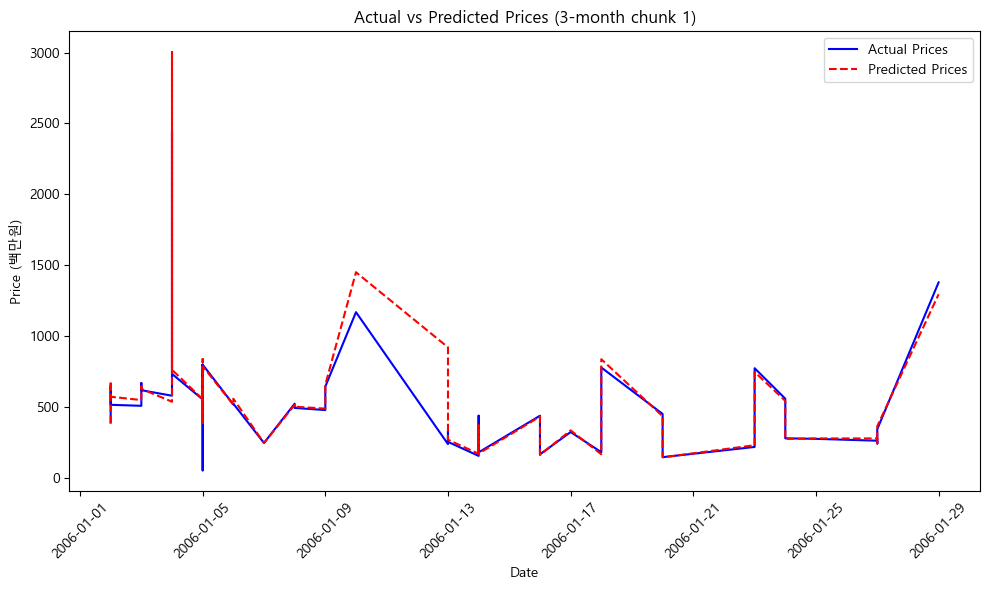

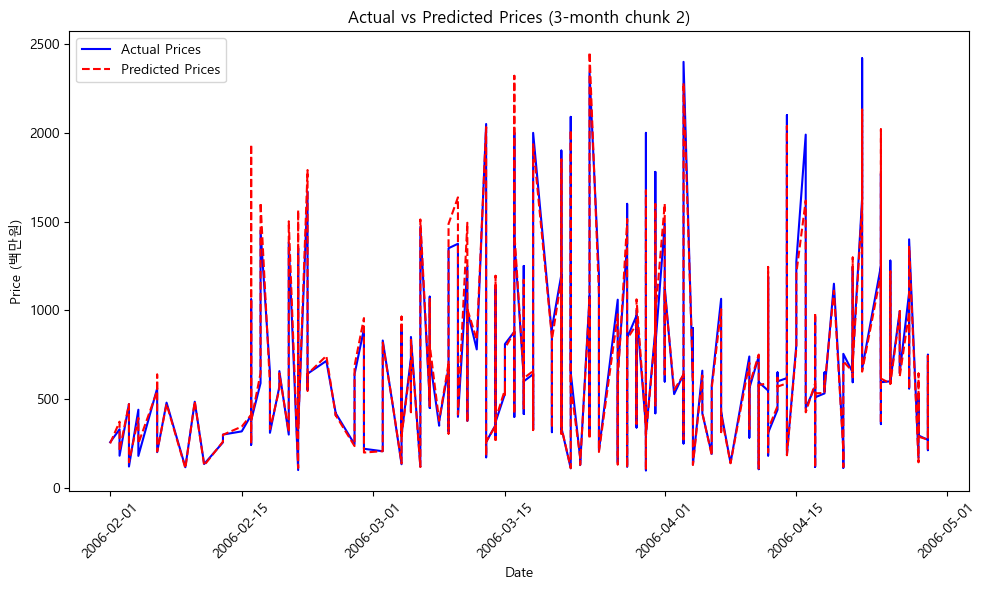

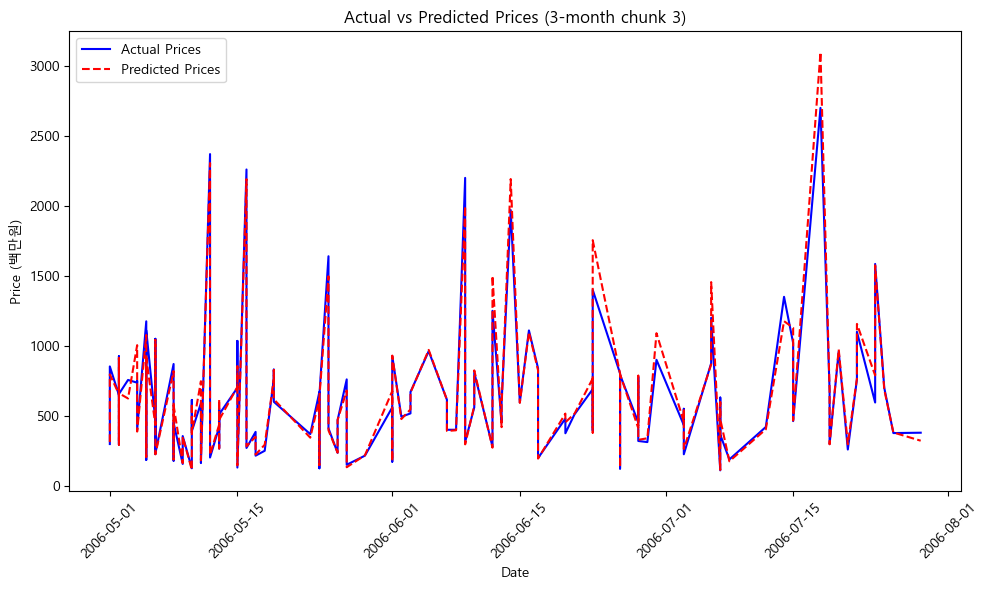

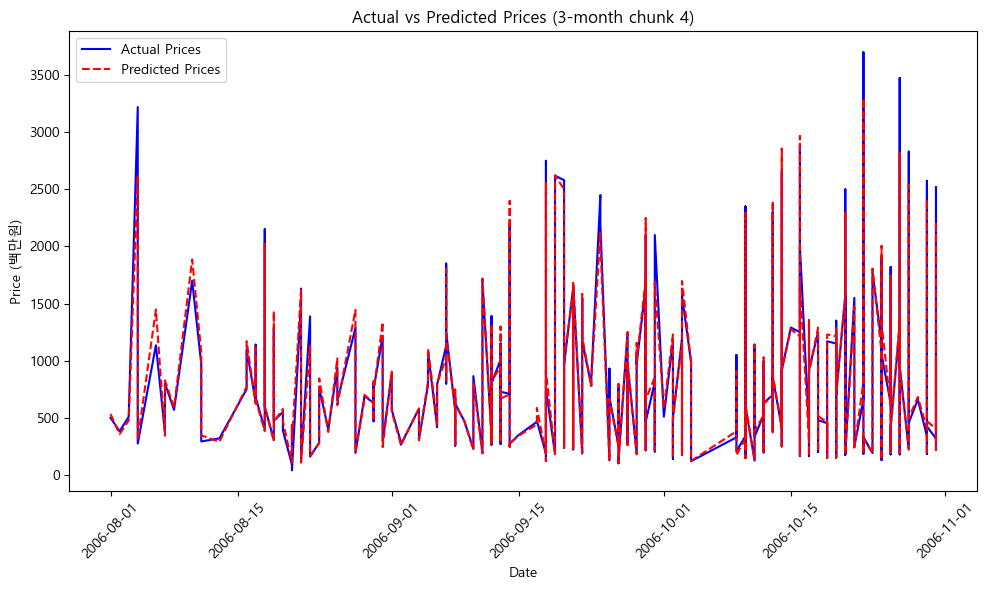

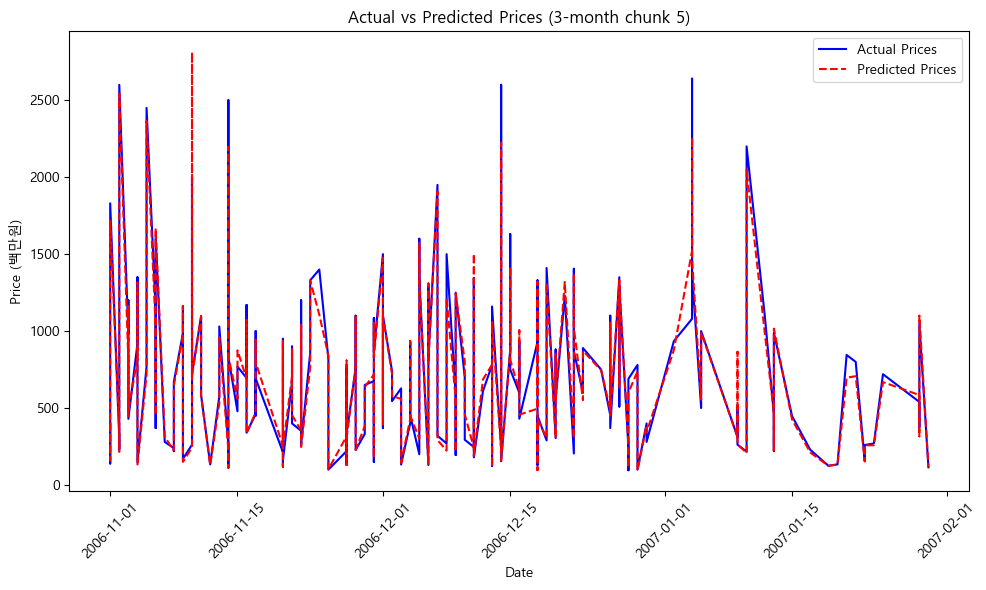

...

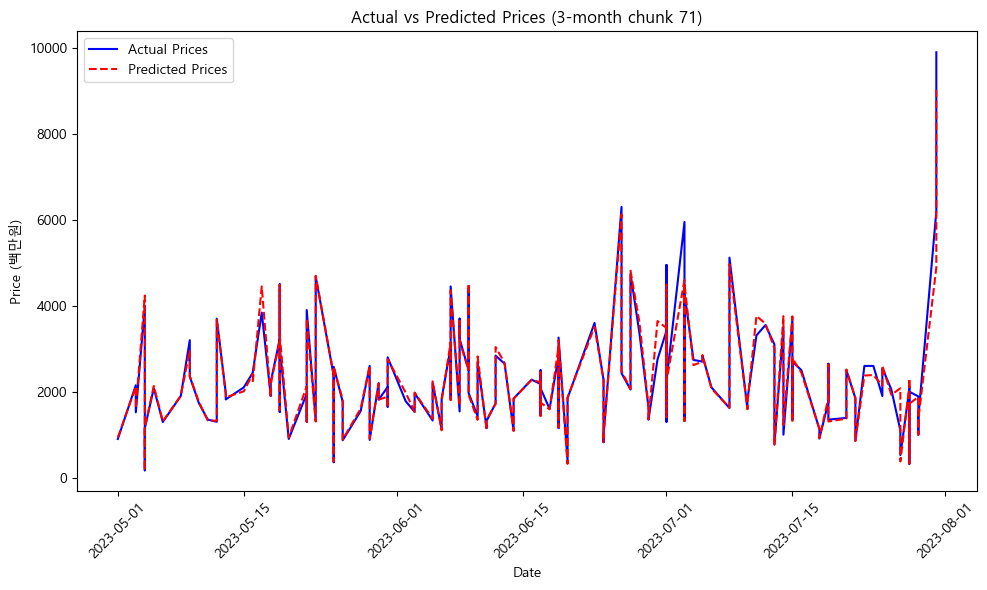

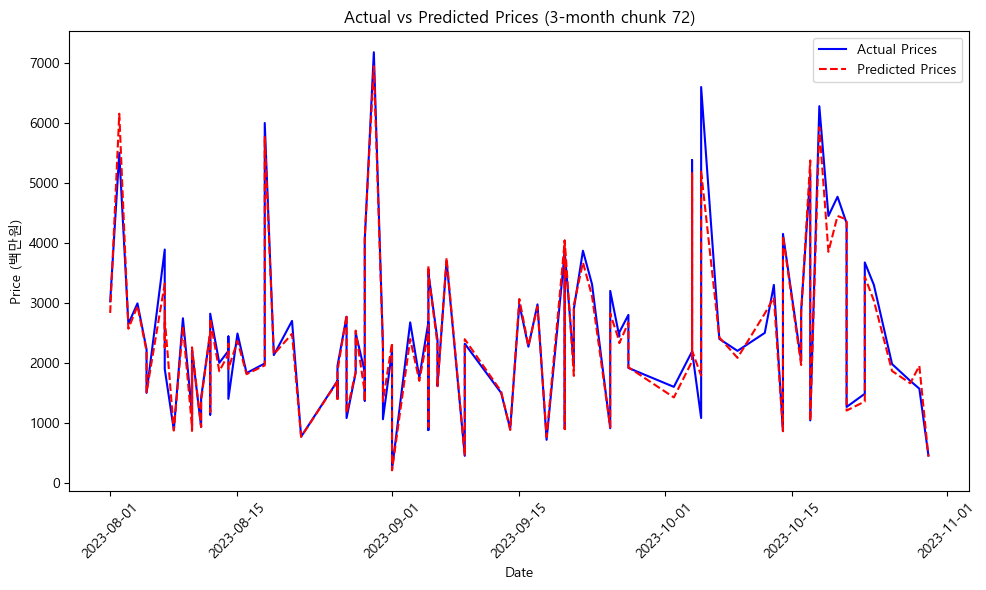

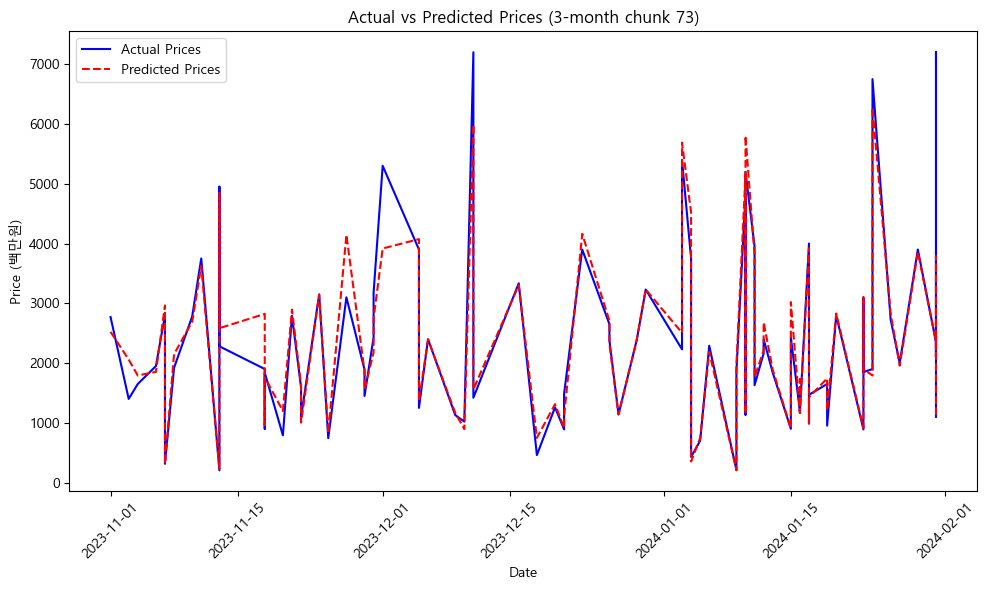

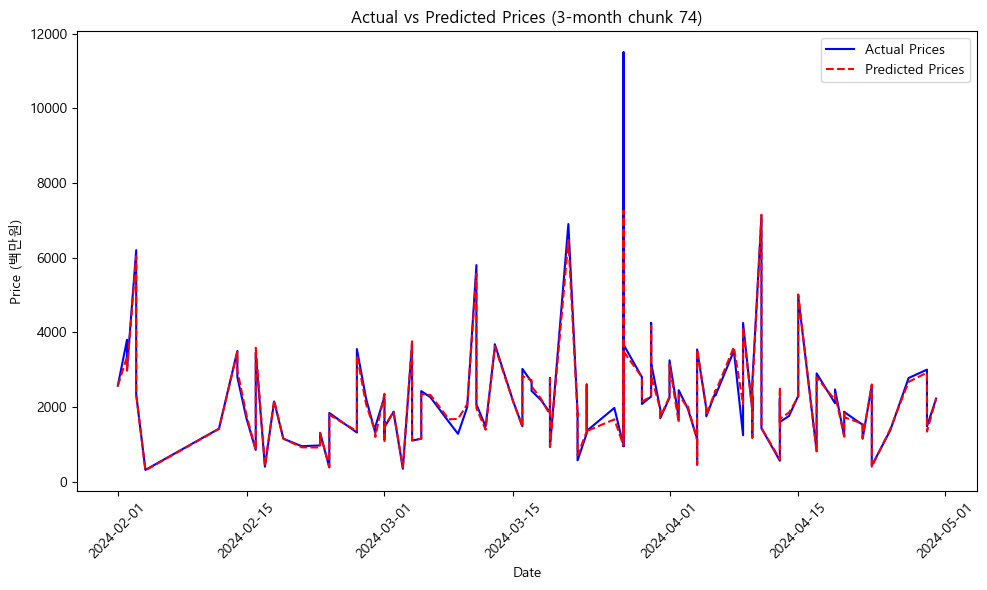

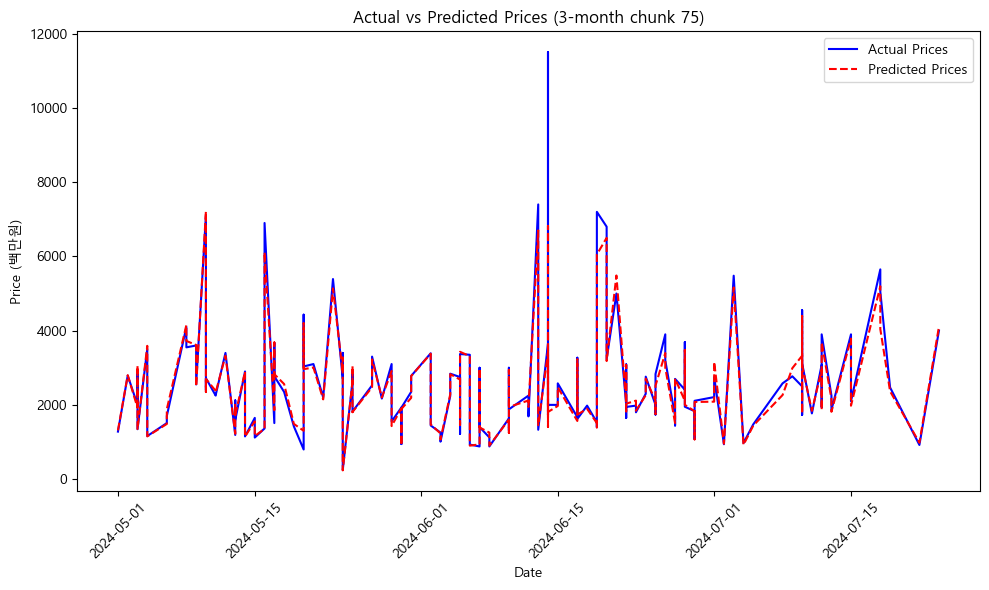

In [19]:

import os
import matplotlib.pyplot as plt

# 'result_images' 폴더가 없으면 생성
output_dir = 'result_images'
if not os.path.exists(output_dir):
    os.makedirs(output_dir)
    
X_test_with_dates = X.loc[X_test.index]  # 원래 인덱스를 사용하여 X_test와 같은 데이터 선택
results = pd.DataFrame({'Date': X_test_with_dates['계약일자'], 'Actual': y_test, 'Predicted': y_pred})

# 정수 값을 날짜로 변환
results['Date'] = convert_days_to_date(results['Date'])

# 6개월 단위로 데이터를 그룹화하여 그래프 그리기
results.set_index('Date', inplace=True)
chunks = results.groupby(pd.Grouper(freq='3M'))

# 각 그룹에 대해 그래프를 그리고 저장하기
for i, (name, chunk) in enumerate(chunks):
    plt.figure(figsize=(10, 6))
    
    # 실제 값 (y_test)
    plt.plot(chunk.index, chunk['Actual'], label='Actual Prices', color='blue')
    
    # 예측 값 (y_pred)
    plt.plot(chunk.index, chunk['Predicted'], label='Predicted Prices', color='red', linestyle='--')
    
    # 그래프 꾸미기
    plt.xlabel('Date')
    plt.ylabel('Price (백만원)')
    plt.title(f'Actual vs Predicted Prices (3-month chunk {i+1})')
    plt.legend()
    
    plt.xticks(rotation=45)
    plt.tight_layout()
    
    
    # 그래프 출력
    plt.show()


In [7]:
# Select random 10 samples from the test set
random_samples = X_test.sample(n=10, random_state=4)

# Predict the values
predictions = model.predict(random_samples)

# Prepare the output with actual and predicted values
actual_values = y_test.loc[random_samples.index]

# Combine them into a dataframe for comparison
comparison_df = pd.DataFrame({'Actual Value': actual_values, 'Predicted Value': predictions})

comparison_df

,Actual Value,Predicted Value
39906,2200.0,2551.8012
6828,5450.0,5427.1000
37344,1400.0,1332.1900
75422,690.0,701.1100
12282,1412.0,1403.6750
43674,420.0,411.2000
52015,435.0,456.1200
57265,180.0,170.4000
59684,1900.0,2118.6700
64718,1183.0,1183.1100


In [8]:
# 날짜 범위 설정
start_date = '2006-01-15'
end_date = '2024-10-15'

# 매달 15일 날짜 생성
date_range = pd.date_range(start=start_date, end=end_date, freq='M') + pd.Timedelta(days=15)
# DataFrame 생성
date_df = pd.DataFrame(date_range, columns=['Date'])

# 'Date' 열을 '계약년월' 형식으로 변환
date_df['계약년월'] = date_df['Date'].dt.strftime('%Y%m')

# 출력
print(date_df)

          Date    계약년월
0   2006-02-15  200602
1   2006-03-15  200603
2   2006-04-15  200604
3   2006-05-15  200605
4   2006-06-15  200606
..         ...     ...
220 2024-06-15  202406
221 2024-07-15  202407
222 2024-08-15  202408
223 2024-09-15  202409
224 2024-10-15  202410

[225 rows x 2 columns]


In [16]:
# 전용면적 X에 해당하는 값 설정
# X_value = 84.0
X_value = "은마"
X_value2 = 84.43

# 전용면적 X에 해당하는 실거래 데이터 필터링
# filtered_df = df_tmp[df_tmp['전용면적'].between(X_value, 85.0, inclusive='left')]
filtered_df = df_tmp[(df_tmp['단지명'] == X_value) & (df_tmp['전용면적'] == X_value2)]

# 날짜 차이를 일 수로 계산
prediction_dates_days = (date_df['Date'] - pd.to_datetime('2006-01-01')).dt.days

# 전용면적 X와 해당 날짜에 대한 예측 입력값 생성
X_imagin = pd.DataFrame({
    '계약일자': filtered_df['계약일자'],
    '금리': filtered_df['금리'],
    '동': le.transform(filtered_df['동']),
    '전용면적': filtered_df['전용면적'],
    '층': filtered_df['층'].median(),  # 층을 중간값으로 설정 (다른 방식도 가능)
    '건축년도': filtered_df['건축년도'],
    'subway_dist': filtered_df['subway_dist'],
})

# 모델을 사용해 예측
y_imagin = model.predict(X_imagin)

In [10]:
y_imagin

array([2461.6  , 1538.055, 1542.55 , ...,  960.835,  828.63 ,  828.63 ])

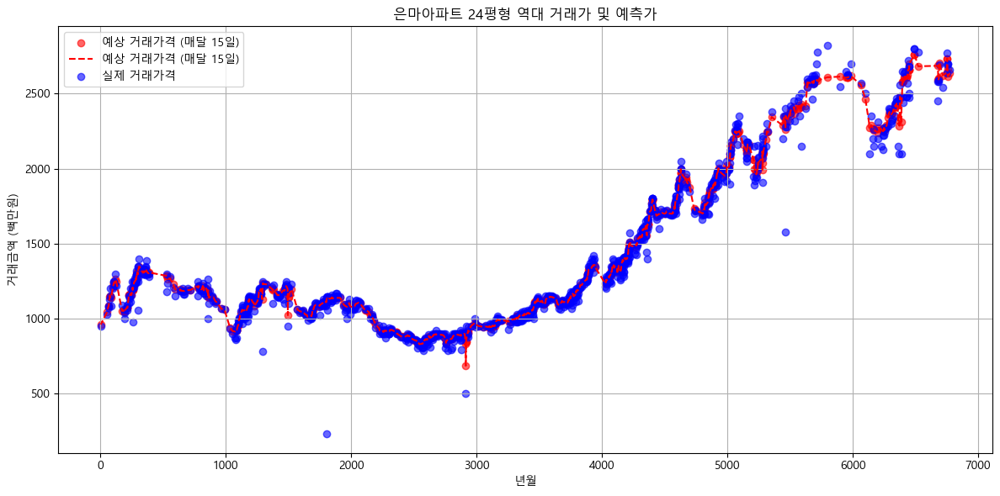

In [18]:
import matplotlib.pyplot as plt
# 그래프 그리기
# 한글 폰트 설정 (예: 맑은 고딕)
plt.rcParams['font.family'] = 'Malgun Gothic'  # 'NanumGothic' 등으로도 변경 가능
plt.rcParams['axes.unicode_minus'] = False  # 마이너스 기호 깨짐 방지
plt.figure(figsize=(12, 6))

# 예측된 값을 점으로 표시
plt.scatter(filtered_df['계약일자'], y_imagin, color='red', label='예상 거래가격 (매달 15일)', alpha=0.6)
# 예측된 값을 선 그래프로 표시
plt.plot(filtered_df['계약일자'], y_imagin, color='red', label='예상 거래가격 (매달 15일)', linestyle='--')

# 실거래 데이터를 점으로 표시
plt.scatter(filtered_df['계약일자'], filtered_df['거래금액(백만원)'], color='blue', label='실제 거래가격', alpha=0.6)


# 그래프 설정
plt.title(f'은마아파트 24평형 역대 거래가 및 예측가')
plt.xlabel('년월')
plt.ylabel('거래금액 (백만원)')
plt.legend()
plt.grid(True)

# 그래프 출력
plt.tight_layout()
plt.show()

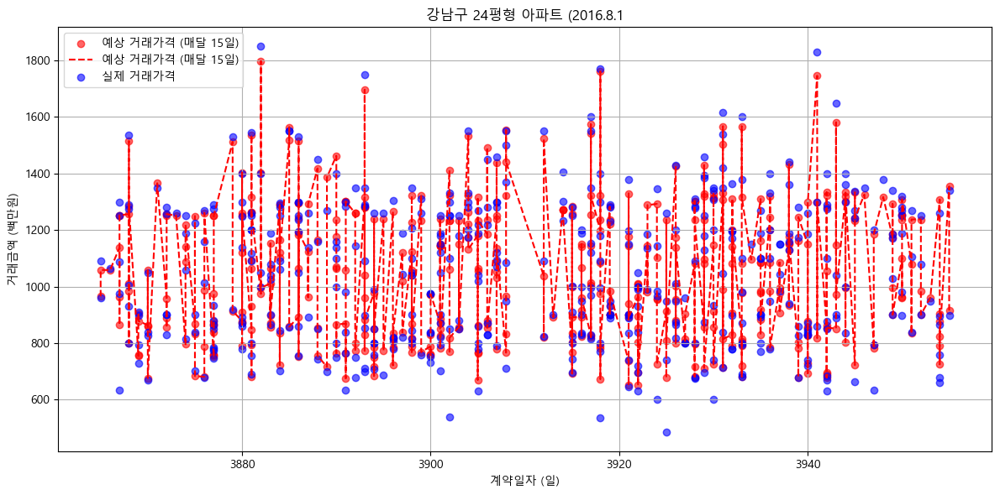

In [12]:
import matplotlib.pyplot as plt

# '계약일자'가 5000부터 5500인 부분 필터링
date_range_mask = (filtered_df['계약일자'] >= 3865) & (filtered_df['계약일자'] <= 3955)
filtered_dates = filtered_df[date_range_mask]
filtered_y_imagin = y_imagin[date_range_mask]

# 한글 폰트 설정 (예: 맑은 고딕)
plt.rcParams['font.family'] = 'Malgun Gothic'  # 'NanumGothic' 등으로도 변경 가능
plt.rcParams['axes.unicode_minus'] = False  # 마이너스 기호 깨짐 방지

# 그래프 그리기
plt.figure(figsize=(12, 6))

# 예측된 값을 점으로 표시
plt.scatter(filtered_dates['계약일자'], filtered_y_imagin, color='red', label='예상 거래가격 (매달 15일)', alpha=0.6)
# 예측된 값을 선 그래프로 표시
plt.plot(filtered_dates['계약일자'], filtered_y_imagin, color='red', label='예상 거래가격 (매달 15일)', linestyle='--')

# 실거래 데이터를 점으로 표시
plt.scatter(filtered_dates['계약일자'], filtered_dates['거래금액(백만원)'], color='blue', label='실제 거래가격', alpha=0.6)

# 그래프 설정
plt.title(f'강남구 24평형 아파트 (2016.8.1')
plt.xlabel('계약일자 (일)')
plt.ylabel('거래금액 (백만원)')
plt.legend()
plt.grid(True)

# 그래프 출력
plt.tight_layout()
plt.show()
